# PROJECT 2

## Cancer detection using CNN

### Requirements

In [1]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import torch

#### Writing Helpers from class resources  (`Week_8_cnn.ipynb`)

In [2]:
def moveTo(obj, device):
    if isinstance(obj, list):
        return [moveTo(x, device) for x in obj]
    elif isinstance(obj, tuple):
        return tuple(moveTo(list(obj), device))
    elif isinstance(obj, set):
        return set(moveTo(list(obj), device))
    elif isinstance(obj, dict):
        to_ret = dict()
        for key, value in obj.items():
            to_ret[moveTo(key, device)] = moveTo(value, device)
        return to_ret
    elif isinstance(obj, torch.Tensor):
        return obj.to(device)
    else:
        return obj

In [3]:
# setup for matplotlib in Jupyter Notebook
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

C:\Users\devdp\AppData\Local\Temp\ipykernel_26880\1153496997.py:4: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


In [4]:
def set_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

In [5]:
torch.backends.cudnn.deterministic=True
set_seed(42)

In [6]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using device: {device}")

Using device: cuda


In [7]:
!nvidia-smi

Mon Apr 21 02:47:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 571.96                 Driver Version: 571.96         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   51C    P8              4W /  120W |       0MiB /   8188MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# EDA

In [8]:
train_full = pd.read_csv('./data/train_labels.csv')

In [9]:
train_full.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [10]:
train_full.isna().sum()

id       0
label    0
dtype: int64

Note: Uncomment this to solve kernel crash error

In [11]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

Text(0.5, 1.0, 'Distribution of Labels in Train Set')

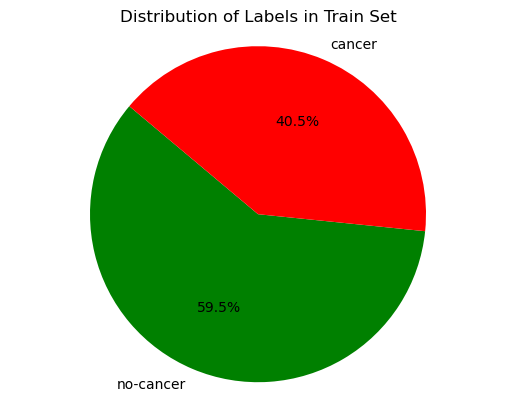

In [12]:
plt.pie(train_full['label'].value_counts(), labels=train_full['label'].map({0: 'no-cancer', 1: 'cancer'}).value_counts().index, autopct='%1.1f%%', colors=['green', 'red'], startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Labels in Train Set')

In [13]:
def visualize_images(images, start_index = 0 , count=10):
    """
    Visualize a set of images from the dataset.
    :param images: DataFrame containing image IDs and labels
    for id, label in images[start_index: start_index+count].iterrows():
        image_path = os.path.join('./data/train/', id + '.tif')
        image = plt.imread(image_path)
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    """
    fig = plt.figure(figsize=(30, 6))
    for idx , val in enumerate(images[start_index: start_index+count].iterrows()):
        id = val[1].id
        label = val[1].label
        ax = fig.add_subplot(2, count//2, idx+1, xticks=[], yticks=[])
        image_path = os.path.join('./data/train/', id + '.tif')
        image = plt.imread(image_path)
        plt.imshow(image)
        ax.set_title(f"Label: {label}")
    plt.show()

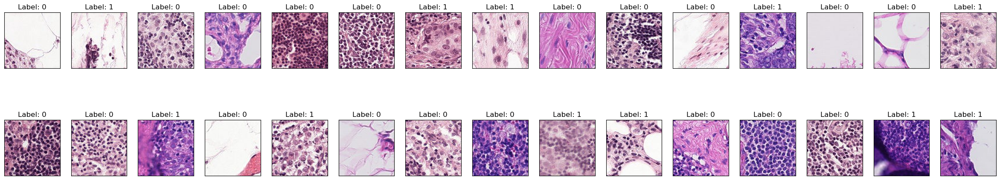

In [14]:
visualize_images(train_full, 0, 30)

## Taking only subset of whole dataset (5000 images)

In [15]:
from sklearn.utils import shuffle

# Sampling 5000 images from the dataset, 2500 with label 1 and 2500 with label 0 to balance the dataset
positive = train_full[train_full['label'] == 1].sample(n=5000//2, random_state=42)
negative = train_full[train_full['label'] == 0].sample(n=5000//2, random_state=42)

train = shuffle(pd.concat([positive, negative])).reset_index(drop=True)

In [16]:
import cv2
from tqdm import tqdm_notebook,trange
def load_data(df, image_dir='./data/train/'):
    """
    Load image data and corresponding labels from a given DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing image IDs and labels.
                         It must have columns 'id' and 'label'.
    - image_dir (str): Path to the directory containing image files.

    Returns:
    - X (np.ndarray): Array of loaded images.
    - y (np.ndarray): Array of corresponding labels.
    """
    images = []
    labels = []

    for image_id, label in tqdm_notebook(zip(df['id'], df['label']), total=len(df), desc="Loading images"):
        image_path = os.path.join(image_dir, f"{image_id}.tif")
        image = cv2.imread(image_path)

        if image is None:
            print(f"Warning: Image {image_path} could not be loaded.")
            continue

        images.append(image)
        labels.append(label)

    print(f"Loaded {len(images)} images and {len(labels)} labels.")
    return np.array(images), np.array(labels)
    


In [17]:
images, labels = load_data(train)

C:\Users\devdp\AppData\Local\Temp\ipykernel_26880\3637710318.py:19: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for image_id, label in tqdm_notebook(zip(df['id'], df['label']), total=len(df), desc="Loading images"):


Loading images:   0%|          | 0/5000 [00:00<?, ?it/s]

Loaded 5000 images and 5000 labels.


In [18]:
print(images.shape, labels.shape)

(5000, 96, 96, 3) (5000,)


In [19]:
positive = images[labels == 1]
negative = images[labels == 0]

## Visulizing features from training images

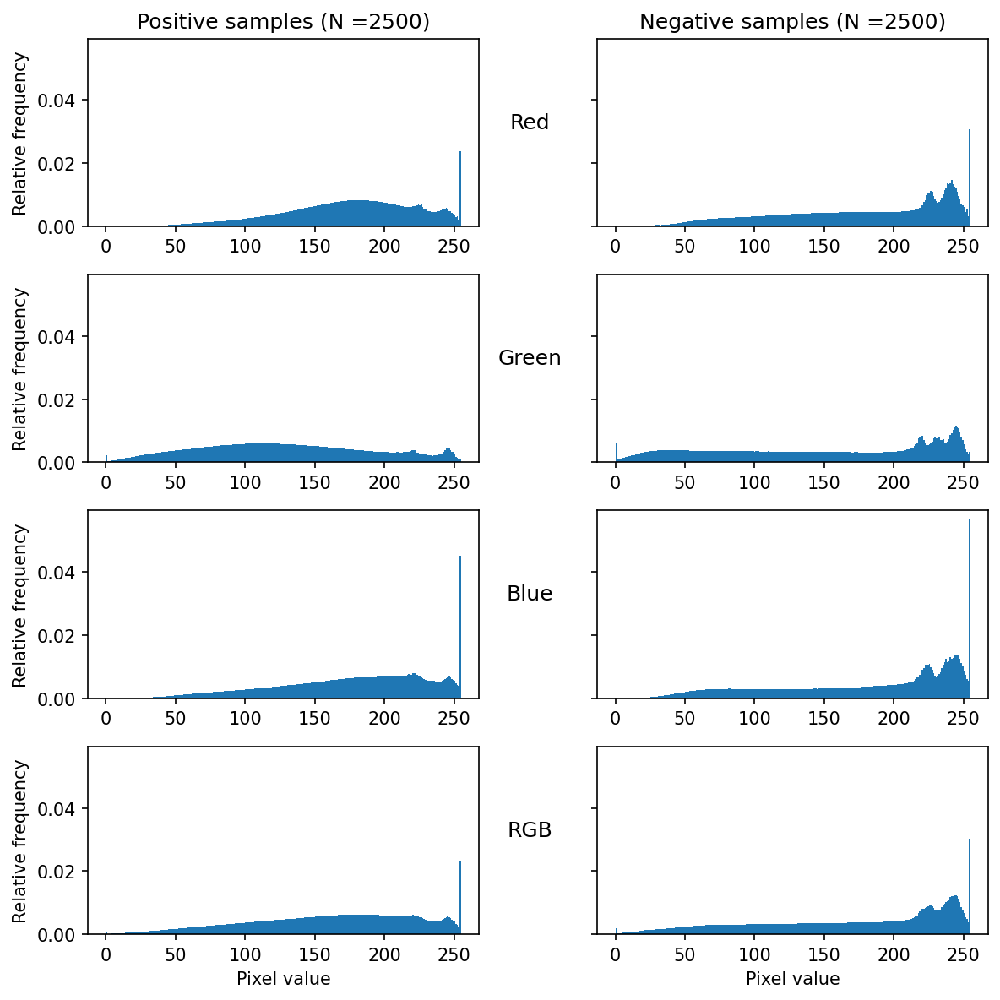

In [20]:
# reference: https://www.kaggle.com/code/walia20/histopathologic-cancer-detection-using-cnns?scriptVersionId=66526139&cellId=17

nr_of_bins = 256 #each possible pixel value will get a bin in the following histograms
fig,axs = plt.subplots(4,2,sharey=True,figsize=(8,8),dpi=150)

#RGB channels
axs[0,0].hist(positive[:,:,:,0].flatten(),bins=nr_of_bins,density=True)
axs[0,1].hist(negative[:,:,:,0].flatten(),bins=nr_of_bins,density=True)
axs[1,0].hist(positive[:,:,:,1].flatten(),bins=nr_of_bins,density=True)
axs[1,1].hist(negative[:,:,:,1].flatten(),bins=nr_of_bins,density=True)
axs[2,0].hist(positive[:,:,:,2].flatten(),bins=nr_of_bins,density=True)
axs[2,1].hist(negative[:,:,:,2].flatten(),bins=nr_of_bins,density=True)

#All channels
axs[3,0].hist(positive.flatten(),bins=nr_of_bins,density=True)
axs[3,1].hist(negative.flatten(),bins=nr_of_bins,density=True)

#Set image labels
axs[0,0].set_title("Positive samples (N =" + str(positive.shape[0]) + ")");
axs[0,1].set_title("Negative samples (N =" + str(negative.shape[0]) + ")");
axs[0,1].set_ylabel("Red",rotation='horizontal',labelpad=35,fontsize=12)
axs[1,1].set_ylabel("Green",rotation='horizontal',labelpad=35,fontsize=12)
axs[2,1].set_ylabel("Blue",rotation='horizontal',labelpad=35,fontsize=12)
axs[3,1].set_ylabel("RGB",rotation='horizontal',labelpad=35,fontsize=12)
for i in range(4):
    axs[i,0].set_ylabel("Relative frequency")
axs[3,0].set_xlabel("Pixel value")
axs[3,1].set_xlabel("Pixel value")
fig.tight_layout()

From above plots we can see the differences in distributions of channels.
Observations:
1. positvie samples the green channel has darker green channels.
2. High pixel values are due to white regions in images

Let's visualize brightness levels of images

Text(0, 0.5, 'Relative frequency')

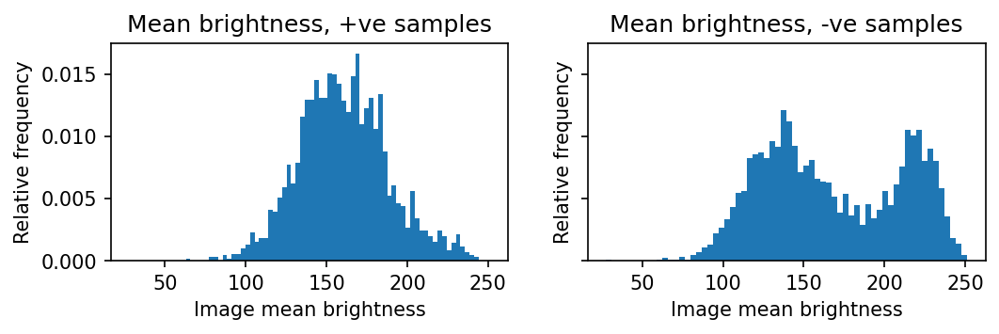

In [21]:
# reference: https://www.kaggle.com/code/walia20/histopathologic-cancer-detection-using-cnns?scriptVersionId=66526139&cellId=19
nr_of_bins = 64 #we use a bit fewer bins to get a smoother image
fig,axs = plt.subplots(1,2,sharey=True, sharex = True, figsize=(8,2),dpi=150)
axs[0].hist(np.mean(positive,axis=(1,2,3)),bins=nr_of_bins,density=True);
axs[1].hist(np.mean(negative,axis=(1,2,3)),bins=nr_of_bins,density=True);
axs[0].set_title("Mean brightness, +ve samples")
axs[1].set_title("Mean brightness, -ve samples")
axs[0].set_xlabel("Image mean brightness")
axs[1].set_xlabel("Image mean brightness")
axs[0].set_ylabel("Relative frequency")
axs[1].set_ylabel("Relative frequency")

From above results we can obeserve:
1. The +ve samples showcase normal distributation and -ve samples showcase bimodal distribution
2. Many images contain bright regions so might need to normalize that.

# Data Processing

## Creating Tensor Dataset

In [22]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import cv2
import pandas as pd
from skimage import io, transform
from sklearn.utils import shuffle

In [23]:

# reference: https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#dataset-class
class CancerDataset(Dataset):
    """Cancer Detection Dataset."""

    def __init__(self, csv_file, root_dir, N=5000, transform=None):
        """
        Arguments:
            csv_file (string): Path to the csv file with labels.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        df = pd.read_csv(csv_file)

        if N:
            # Ensure class balance: 2500 from each class
            negative_df = df[df['label'] == 0].sample(n=N//2, random_state=42)
            positive_df = df[df['label'] == 1].sample(n=N//2, random_state=42)
            df = shuffle(pd.concat([positive_df, negative_df])).reset_index(drop=True)

        self.images = df
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir, self.images.iloc[idx, 0] + ".tif")
        image = io.imread(img_name) 

        label = int(self.images.iloc[idx, 1])  # 0 or 1
        sample = {'image': image, 'label': label, "id" : self.images.iloc[idx, 0]}

        if self.transform:
            sample['image'] = self.transform(image)

        return sample

In [24]:
cancer_dataset = CancerDataset(
    csv_file='./data/train_labels.csv',
    root_dir='./data/train',
)

In [25]:
import matplotlib.pyplot as plt

def show_samples(dataset, num_samples=4, figsize=(15, 5)):
    """
    Visualize sample images from a dataset.

    Args:
        dataset (Dataset): PyTorch dataset object with 'image' and 'label'.
        num_samples (int): Number of samples to visualize.
        figsize (tuple): Size of the matplotlib figure.
    """
    fig = plt.figure(figsize=figsize)

    for i, sample in enumerate(dataset):
        image = sample['image']
        label = sample['label']
        id = sample['id']

        # If image is a tensor, convert to numpy and unnormalize
        if isinstance(image, torch.Tensor):
            image = image.permute(1, 2, 0).numpy()  # CxHxW to HxWxC
            image = image * 0.5 + 0.5  # Unnormalize (if normalized with mean=0.5, std=0.5)

        ax = plt.subplot(1, num_samples, i + 1)
        plt.tight_layout()
        ax.set_title(f"Label: {label}")
        ax.axis('off')
        plt.imshow(image)

        if i == num_samples - 1:
            plt.show()
            break

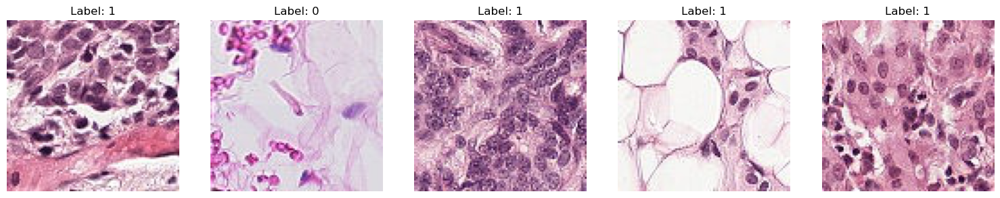

In [26]:
show_samples(cancer_dataset, num_samples=5)

### Defining data augmentation methods

In [27]:
from torchvision.transforms import v2

# Augmentation Method 1: Geometric and Color Transformations
aug_method_1 = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    v2.RandomVerticalFlip(p=0.5),  # Randomly flip the image vertically
    v2.RandomRotation(degrees=30),  # Rotate the image within ±30 degrees
    v2.ColorJitter(
        brightness=0.2,
        contrast=0.2,
    ),  # Adjust image color properties
    v2.ToTensor(),  # Convert image to tensor
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Augmentation Method 2: Added Elastic Transform in previous method
aug_method_2 = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    v2.RandomVerticalFlip(p=0.5),
    v2.RandomRotation(degrees=15),  # Slight random rotation,
    v2.ColorJitter(
        brightness=0.3,
        contrast=0.3
    ),  # Adjust brightness and contrast
    v2.ToTensor(),  # Convert image to tensor
    v2.ElasticTransform(alpha=30.0),  # Slight tissue deformation
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


val_test_aug_method = v2.Compose([
    v2.ToPILImage(),
    v2.Resize((224, 224)),  # For ResNet model
    v2.ToTensor(),  # Convert image to tensor
    v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

c:\Users\devdp\anaconda3\Lib\site-packages\torchvision\transforms\v2\_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [28]:
from torch.utils.data import random_split 

def split_data(dataset:Dataset):

    total_size = len(dataset)
    train_size = int(0.7 * total_size)
    val_size = int(0.2 * total_size)
    test_size = total_size - train_size - val_size

    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size],
        generator=torch.Generator().manual_seed(42)
    )

    return train_dataset, val_dataset, test_dataset

def create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size=32):
    """
    Creates DataLoaders from train, val, and test datasets.

    Args:
        train_dataset: Training dataset.
        val_dataset: Validation dataset.
        test_dataset: Test dataset.
        batch_size (int): Batch size for loaders.

    Returns:
        train_loader, val_loader, test_loader
    """
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader


def generate_data(file, img_dir, options, N=5000 ):
    """
    Generate data loaders and datasets based on the provided options.
    
    Args:
        file (str): Path to the CSV file containing image IDs and labels.
        img_dir (str): Directory containing the images.
        options (list): List of dictionaries containing options for data generation.
        N (int): Number of samples to load from the dataset.
    Returns:
        results (list): List of dictionaries containing configurations for each option.
        Each dictionary contains the name, loaders, datasets, and parameters.
    """
    
    
    results = []

    for idx, option in enumerate(options):
        name = option.get("name", None)
        transformer = option.get("transformer", None)
        split = option.get("split", [0.7,0.2,0.2])
        val_test_transformer = option.get("val_test_transformer", None)
        assert len(split) == 3, "Length of split should be 3"

        dataset = CancerDataset(
            csv_file=file,
            root_dir=img_dir,
            transform=transformer,
            N=N
        )

        train_dataset, val_dataset, test_dataset = split_data(dataset)
        val_dataset.dataset.transform = val_test_transformer
        train_loader, val_loader, test_loader = create_data_loaders(
            train_dataset, val_dataset, test_dataset,
            batch_size=32
        )
        val_dataset.dataset.transform = val_test_transformer
        test_dataset.dataset.transform = val_test_transformer
        config = {
                "name" : name if name else f"config_{idx+1}",
                "loaders":{
                    "train_loader": train_loader,
                    "val_loader": val_loader,
                    "test_loader": test_loader,
                },
                "datasets":{
                    "train_dataset": train_dataset,
                    "val_dataset": val_dataset,
                    "test_dataset": test_dataset,
                },
                "parameters":{
                    "transformer": transformer,
                    "val_test_transformer": val_test_transformer,
                    "split": split
                }
            }

        results.append(config)
    return results
        

In [29]:
options = [
    {
        "name": "Augmentation Method 1",
        "transformer": aug_method_1,
        "val_test_transformer": val_test_aug_method,
        "split": [0.7, 0.2, 0.1]
    },
    {
        "name": "Augmentation Method 2",
        "transformer": aug_method_2,
        "val_test_transformer": val_test_aug_method,
        "split": [0.7, 0.2, 0.1]
    }
]

data_configs = generate_data(file="./data/train_labels.csv", img_dir="./data/train", options=options, N=5000)
for config in data_configs:
    print(f"Configuration: {config['name']}")
    print(f"Train Loader: {len(config['loaders']['train_loader'])} batches")
    print(f"Validation Loader: {len(config['loaders']['val_loader'])} batches")
    print(f"Test Loader: {len(config['loaders']['test_loader'])} batches")
    print("-" * 100)

Configuration: Augmentation Method 1
Train Loader: 110 batches
Validation Loader: 32 batches
Test Loader: 16 batches
----------------------------------------------------------------------------------------------------
Configuration: Augmentation Method 2
Train Loader: 110 batches
Validation Loader: 32 batches
Test Loader: 16 batches
----------------------------------------------------------------------------------------------------


In [30]:
def plot_images_for_configs(data_configs, num_images=5):
    """
    Plot a specified number of images for each configuration and dataset (train, validation, test).

    Args:
        data_configs (list): List of data configurations containing datasets and loaders.
        num_images (int): Number of images to plot for each dataset.
    """
    for config in data_configs:
        print(f"Configuration: {config['name']}")
        datasets = config['datasets']
        for dataset_name, dataset in datasets.items():
            print(f"Dataset: {dataset_name}")
            fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
            for i in range(num_images):
                sample = dataset[i]
                image = sample['image']
                label = sample['label']

                # If image is a tensor, convert to numpy and unnormalize
                if isinstance(image, torch.Tensor):
                    image = image.permute(1, 2, 0).numpy()  # CxHxW to HxWxC
                    image = image * 0.5 + 0.5  # Unnormalize (if normalized with mean=0.5, std=0.5)

                axs[i].imshow(image)
                axs[i].set_title(f"Label: {label}")
                axs[i].axis('off')
            plt.tight_layout()
            plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Configuration: Augmentation Method 1
Dataset: train_dataset


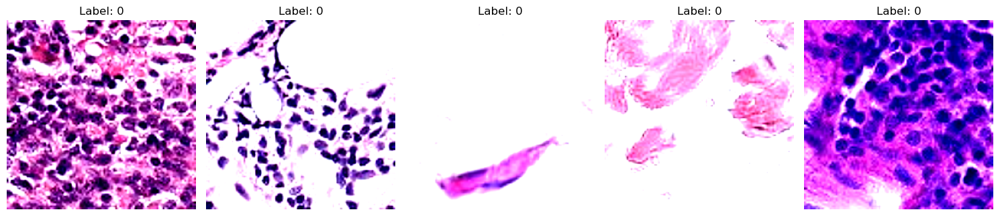

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: val_dataset


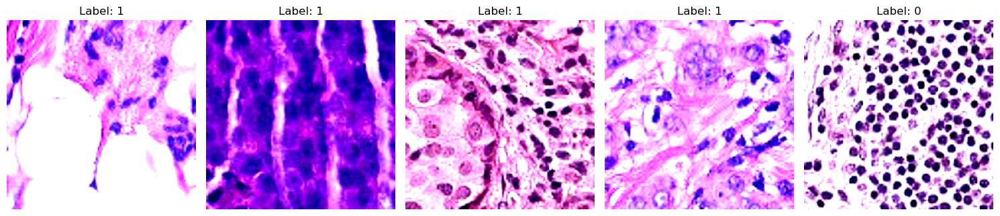

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: test_dataset


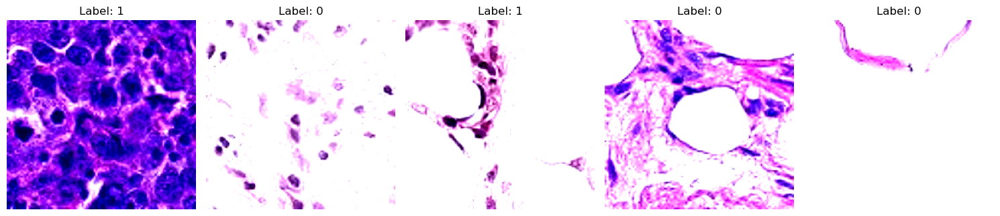

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Configuration: Augmentation Method 2
Dataset: train_dataset


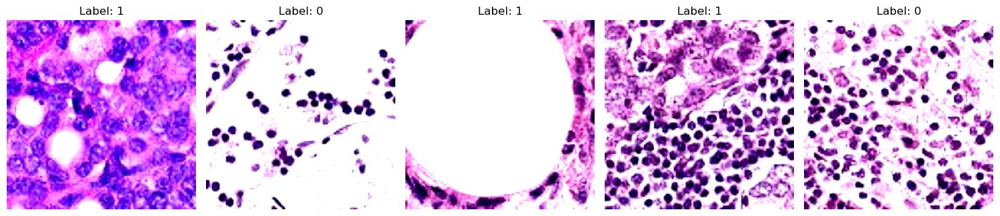

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: val_dataset


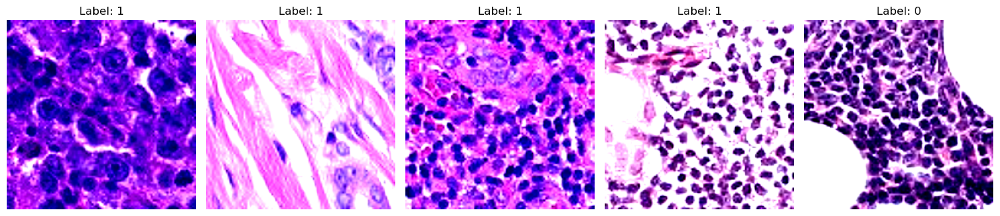

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Dataset: test_dataset


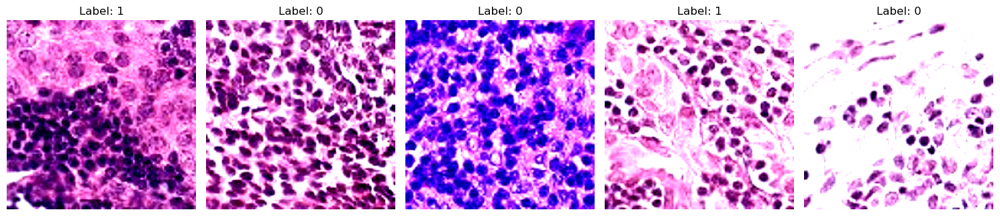

In [31]:
plot_images_for_configs(data_configs, num_images=5)

# Model Preperation

### Helper functions from `week_8_cnn.ipynb`

In [32]:
# reference : https://stackoverflow.com/a/71999355
class EarlyStopping:
    def __init__(self, patience=5, mode='min', delta=0.0):
        self.patience = patience
        self.counter = 0
        self.early_stop = False
        self.mode = mode
        self.delta = delta
        self.best_model_wts  = None
        self._best_score : int | None = None

        if mode == 'min':
            self.best_score = float('inf')
        elif mode == 'max':
            self.best_score = float('-inf')
        else:
            raise ValueError("mode must be 'min' or 'max'")

    def __call__(self, current_score):
        if self.mode == 'min':
            improved = current_score < self.best_score - self.delta
        else:  # mode == 'max'
            improved = current_score > self.best_score + self.delta

        if improved:
            self.best_score = current_score
            self.counter = 0
            return True
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
            return False


In [33]:
import time
import timeit
from tqdm.autonotebook import tqdm
import copy

def run_epoch(model, optimizer, data_loader, loss_func, device, results, score_funcs, prefix="", desc=None):
    """
    model -- the PyTorch model / "Module" to run for one epoch
    optimizer -- the object that will update the weights of the network
    data_loader -- DataLoader object that returns tuples of (input, label) pairs.
    loss_func -- the loss function that takes in two arguments, the model outputs and the labels, and returns a score
    device -- the compute lodation to perform training
    score_funcs -- a dictionary of scoring functions to use to evalue the performance of the model
    prefix -- a string to pre-fix to any scores placed into the _results_ dictionary.
    desc -- a description to use for the progress bar.
    """
    running_loss = []
    y_true = []
    y_pred = []
    start = time.time()
    for i in tqdm(data_loader, desc=desc, leave=False):
        inputs, labels = i['image'], i['label']
        #Move the batch to the device we are using.
        inputs = moveTo(inputs, device)
        labels = moveTo(labels, device)

        y_hat = model(inputs) #this just computed f_Θ(x(i))
        # Compute loss.
        loss = loss_func(y_hat, labels)

        if model.training:
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        #Now we are just grabbing some information we would like to have
        running_loss.append(loss.item())

        if len(score_funcs) > 0 and isinstance(labels, torch.Tensor):
            #moving labels & predictions back to CPU for computing / storing predictions
            labels = labels.detach().cpu().numpy()
            y_hat = y_hat.detach().cpu().numpy()
            #add to predictions so far
            y_true.extend(labels.tolist())
            y_pred.extend(y_hat.tolist())
    #end training epoch
    end = time.time()

    y_pred = np.asarray(y_pred)
    if len(y_pred.shape) == 2 and y_pred.shape[1] > 1: #We have a classification problem, convert to labels
        y_pred = np.argmax(y_pred, axis=1)
    #Else, we assume we are working on a regression problem

    results[prefix + " loss"].append( np.mean(running_loss) )
    for name, score_func in score_funcs.items():
        try:
            results[prefix + " " + name].append( score_func(y_true, y_pred) )
        except:
            results[prefix + " " + name].append(float("NaN"))

    # clear memory
    del y_true, y_pred, running_loss
    torch.cuda.empty_cache()
    
    return end-start #time spent on epoch

def train_network(model, loss_func, train_loader, val_loader=None, test_loader=None,score_funcs=None,
                         epochs=10, device="cpu", checkpoint_file=None,
                         lr_schedule=None, optimizer=None, disable_tqdm=False,
                         early_stopping : EarlyStopping =None,
                         model_destination = None
                        ):
    """Train simple neural networks

    Keyword arguments:
    model -- the PyTorch model / "Module" to train
    loss_func -- the loss function that takes in batch in two arguments, the model outputs and the labels, and returns a score
    train_loader -- PyTorch DataLoader object that returns tuples of (input, label) pairs.
    val_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    test_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    score_funcs -- A dictionary of scoring functions to use to evalue the performance of the model
    epochs -- the number of training epochs to perform
    device -- the compute lodation to perform training
    lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use.
    optimizer -- the method used to alter the gradients for learning.

    """
    if score_funcs == None:
        score_funcs = {}#Empty set

    to_track = ["epoch", "total time", "train loss"]
    if val_loader is not None:
        to_track.append("val loss")
    if test_loader is not None:
        to_track.append("test loss")
    for eval_score in score_funcs:
        to_track.append("train " + eval_score )
        if val_loader is not None:
            to_track.append("val " + eval_score )
        if test_loader is not None:
            to_track.append("test "+ eval_score )

    total_train_time = 0 #How long have we spent in the training loop?
    results = {}
    #Initialize every item with an empty list
    for item in to_track:
        results[item] = []


    if optimizer == None:
        #The AdamW optimizer is a good default optimizer
        optimizer = torch.optim.AdamW(model.parameters())
        del_opt = True
    else:
        del_opt = False

    #Place the model on the correct compute resource (CPU or GPU)
    model.to(device)
    best_model_wts = None
    epoch_bar = tqdm(range(epochs), desc="Epoch", disable=disable_tqdm)
    for epoch in epoch_bar:
        model = model.train()#Put our model in training mode

        total_train_time += run_epoch(model, optimizer, train_loader, loss_func, device, results, score_funcs, prefix="train", desc="Training")

        results["epoch"].append( epoch )
        results["total time"].append( total_train_time )


        if val_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="val", desc="Validating")

        #In PyTorch, the convention is to update the learning rate after every epoch
        if lr_schedule is not None:
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()

        if test_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, test_loader, loss_func, device, results, score_funcs, prefix="test", desc="Testing")

        postfix_dict = {
            "Train Loss": f"{results['train loss'][-1]:.4f}",
            "Val Loss": f"{results['val loss'][-1]:.4f}" if results['val loss'] else "N/A",
            "Train Acc": f"{results['train Accuracy'][-1]:.4f}" if 'train Accuracy' in results and results['train Accuracy'] else "N/A",
            "Val Acc": f"{results['val Accuracy'][-1]:.4f}" if 'val Accuracy' in results and results['val Accuracy'] else "N/A"
        }
        epoch_bar.set_postfix(postfix_dict)


        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results' : results
                }, checkpoint_file)
        if early_stopping:
            current_val_accuracy = results['val Accuracy'][-1]
            improved = early_stopping(current_val_accuracy)
            best_model_wts = copy.deepcopy(model.state_dict())  # 🛟 Tracking best model
            postfix_dict["Observation"] = f"[Epoch {epoch+1}] 🔼 Validation accuracy improved to {current_val_accuracy:.4f} (best so far). Resetting patience." if improved else f"[Epoch {epoch+1}] ⚠️ No improvement in validation accuracy ({current_val_accuracy:.4f}). Best remains {early_stopping.best_score:.4f}. Patience: {early_stopping.counter}/{early_stopping.patience}"
            epoch_bar.set_postfix(postfix_dict)
            if early_stopping.early_stop:
                print(f"\n⛔ Early stopping triggered at epoch {epoch+1}. Stopping training.")
                break
            
    if best_model_wts is not None and early_stopping is not None:
        print(f"🔁 Restoring best model from epoch with validation accuracy {early_stopping.best_score:.4f}")
        model.load_state_dict(best_model_wts)
        if model_destination is not None:
            torch.save(model, model_destination + '/model.pth')
            torch.save(model.state_dict(), model_destination + "/state_dict.pth")
    if del_opt:
        del optimizer
    return pd.DataFrame.from_dict(results)

C:\Users\devdp\AppData\Local\Temp\ipykernel_26880\1538014251.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## 1. ResNet50
## For the first model I will use ResNet50 pretrained model

reference : https://medium.com/@nitishkundu1993/exploring-resnet50-an-in-depth-look-at-the-model-architecture-and-code-implementation-d8d8fa67e46f

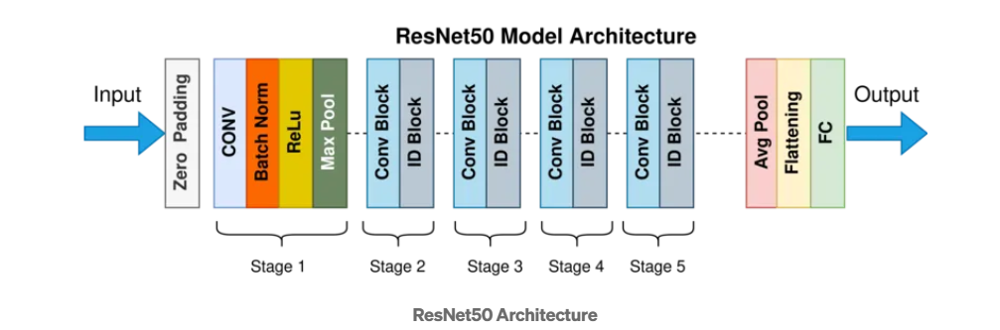

In [34]:
import torch
from torchvision.models import resnet50, ResNet50_Weights
from sklearn.metrics import accuracy_score
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingLR 

In [35]:
def get_model():
    # Loading the pretrained ResNet50 model
    model = resnet50(weights=ResNet50_Weights.DEFAULT)

    # Freezing all layers except the last fully connected layer
    for param in model.parameters():
        param.requires_grad = False
    # Unfreezing the last fully connected layer
    for param in model.fc.parameters():
        param.requires_grad = True
        
    # Modifying final layer for binary classification
    num_classes = 2
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 512),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(512, num_classes),
        nn.Softmax(dim=1)
    )
    return model

In [36]:
def prepare_model_config(name, optimizer_cls, lr, model,  scheduler_cls=None, scheduler_kwargs=None):
    optimizer = optimizer_cls(model.fc.parameters(), lr=lr)
    lr_schedule = None
    if scheduler_cls:
        lr_schedule = scheduler_cls(optimizer, **(scheduler_kwargs or {}))
    
    return {
        "name": name,
        "model": model,
        "optimizer": optimizer,
        "lr_schedule": lr_schedule
    }


### Fine-tuning the model

In [37]:
import datetime 
def train_pipeline(model_configs, data_configs, loss_func, device, score_funcs={'Accuracy': accuracy_score}, epochs=20):
    """
    Train the model with different configurations and data loaders.
    Args:
        model_configs (list): List of model configurations.
        data_configs (list): List of data configurations.
        loss_func: Loss function to use for training.
        device: Device to use for training (CPU or GPU).
        early_stopping: Early stopping object to monitor validation performance.
        score_funcs: Dictionary of scoring functions to evaluate the model.
        epochs: Number of epochs to train the model.
        Returns:
            results (DataFrame): DataFrame containing training results for each configuration.
    """
    results = None
    startTime = datetime.datetime.now()
    for model_config in tqdm(model_configs, desc="Running model Configurations"):
        for data_config in tqdm(data_configs, desc="Running data Configurations"):
            early_stopping = EarlyStopping(patience=5, mode='max', delta=0.01)
            model = model_config['model']
            optimizer = model_config['optimizer']
            lr_schedule = model_config['lr_schedule']

            model.to(device)
            model_destination = f"./saved_models/{model_config['name']}_{data_config['name']}_{startTime.strftime('%Y-%m-%d-%H-%M')}"
            os.makedirs(model_destination, exist_ok=True)
            _results = train_network(
                model=model,
                loss_func=loss_func,
                train_loader=data_config['loaders']['train_loader'],
                val_loader=data_config['loaders']['val_loader'],
                test_loader=data_config['loaders']['test_loader'],
                score_funcs=score_funcs,
                epochs=epochs,
                device=device,
                optimizer=optimizer,
                lr_schedule=lr_schedule,
                early_stopping=early_stopping,
                model_destination=model_destination,
            )
            _results['model_config'] = model_config['name']
            _results['data_config'] = data_config['name']
            _results['transformer'] = data_config['parameters']['transformer']
            _results['val_test_transformer'] = data_config['parameters']['val_test_transformer']
            if results is None:
                results = _results
            else:
                results = pd.concat([results, _results], ignore_index=True)
    return results

In [38]:
model_configs = [
    prepare_model_config(
        name="ResNet50_config_1 (adam + reduceLROnPlateau)",
        model = get_model(),
        optimizer_cls=optim.AdamW,
        lr=0.001,
        scheduler_cls=ReduceLROnPlateau,
        scheduler_kwargs={"mode": "min", "factor": 0.5, "patience": 3, "verbose": True}
    ),
    prepare_model_config(
        name="ResNet50_config_2 (sgd + reduceLROnPlateau)",
        model = get_model(),
        optimizer_cls=optim.SGD,
        lr=0.001,
        scheduler_cls=ReduceLROnPlateau,
        scheduler_kwargs={"mode": "min", "factor": 0.5, "patience": 3, "verbose": True}
    ),
    prepare_model_config(
        name="ResNet50_config_3 (adam + cosineAnnealing)",
        model = get_model(),
        optimizer_cls=optim.AdamW,
        lr=0.001,
        scheduler_cls=CosineAnnealingLR,
        scheduler_kwargs={"T_max": 20}
    ),
    prepare_model_config(
        name="ResNet50_config_4 (sgd + cosineAnnealing)",
        model = get_model(),
        optimizer_cls=optim.SGD,
        lr=0.001,
        scheduler_cls=CosineAnnealingLR,
        scheduler_kwargs={"T_max": 20}
    ),
]


c:\Users\devdp\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [39]:

loss_func = nn.CrossEntropyLoss()
results = train_pipeline(model_configs, data_configs, loss_func, device)

Running model Configurations:   0%|          | 0/4 [00:00<?, ?it/s]

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 8. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.8430


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.8850


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

🔁 Restoring best model from epoch with validation accuracy 0.7630


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7720


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 9. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.8440


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.8850


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 13. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7260


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7420


In [40]:
results.to_csv("results_resnet50.csv", index=False)

In [41]:
import math

def plot_results(results, model_configs, data_configs, title):
    """
    Plot results of the training process for different model and data configurations.
    Args:
        results (DataFrame): DataFrame containing training results.
        model_configs (list): List of model configurations.
        data_configs (list): List of data configurations.
    Returns:
        None: Displays the plots.
    """
    # Count total plots needed
    total_plots = len(model_configs) * len(data_configs)

    # Create subplot grid (auto-calculated rows/cols)
    cols = 2
    rows = math.ceil(total_plots / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4.5, rows * 3.5))
    axes = axes.flatten()  # make 1D for easy indexing

    # Plot results
    plot_idx = 0
    for model_config in model_configs:
        for data_config in data_configs:
            _results = results[(results['model_config'] == model_config['name']) & 
                            (results['data_config'] == data_config['name'])]

            ax = axes[plot_idx]
            ax.set_title(f"Model: {model_config['name']}\nData: {data_config['name']}")
            
            sns.lineplot(x='epoch', y='train Accuracy', data=_results, label='Train', ax=ax)
            sns.lineplot(x='epoch', y='val Accuracy', data=_results, label='Validation', ax=ax)  
            # sns.lineplot(x='epoch', y='test Accuracy', data=_results, label='Test', ax=ax)  
            ax.set_title(f'{_results["model_config"].values[0]} / {_results["data_config"].values[0]}', fontsize=8)
            ax.set_xlabel('Epoch', fontsize=8)
            ax.set_ylabel('Accuracy', fontsize=8)
            ax.legend(fontsize=8)
            
            
            plot_idx += 1

    # Hide unused subplots
    for i in range(plot_idx, len(axes)):
        fig.delaxes(axes[i])

    fig.suptitle(title, fontsize=14)

    plt.tight_layout()
    plt.show()

c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

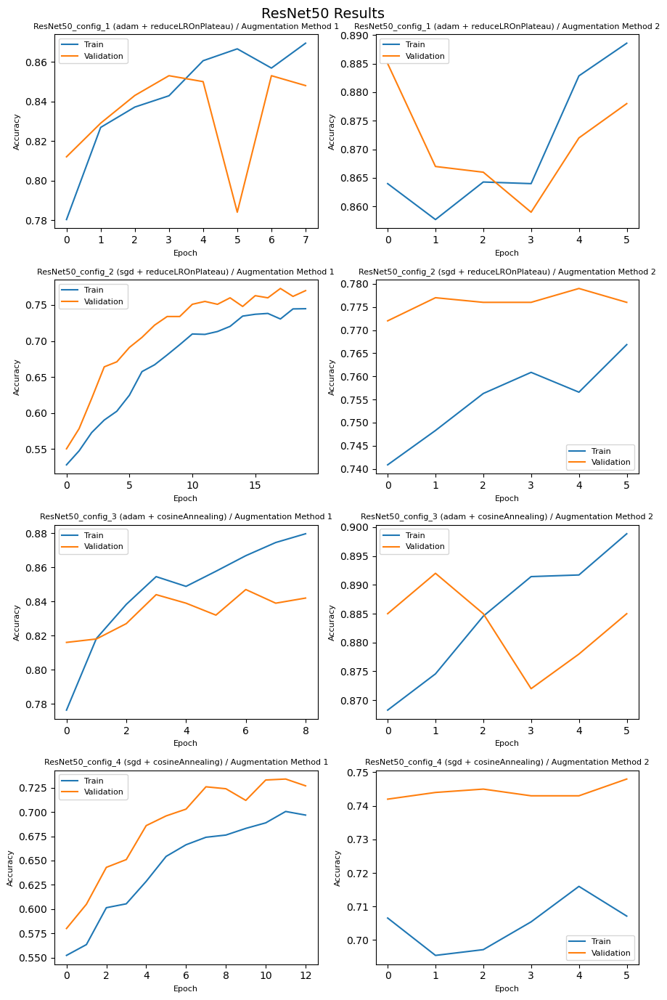

In [42]:
plot_results(results, model_configs, data_configs, title="ResNet50 Results")

# Custom CNN (**InceptionResidualNet**) architecture
![inceptionresidualnet](images/inceptionresidualnet.svg)


In [43]:
import torch
import torch.nn
import torch.nn.functional as F

In [44]:
def print_dim(model, input_size):
  X = torch.rand(size=(1, 1, input_size, input_size), dtype=torch.float32)
  for layer in model:
    X = layer(X)
    print(layer.__class__.__name__, 'output shape: \t', X.shape)

In [45]:
class InceptionBlock(nn.Module):
    # `c1`--`c4` are the number of output channels for each branch
    def __init__(self, c1, c2, c3, c4, **kwargs):
        super(InceptionBlock, self).__init__(**kwargs)
        # Branch 1
        self.b1_1 = nn.LazyConv2d(c1, kernel_size=1)
        # Branch 2
        self.b2_1 = nn.LazyConv2d(c2[0], kernel_size=1)
        self.b2_2 = nn.LazyConv2d(c2[1], kernel_size=3, padding=1)
        # Branch 3
        self.b3_1 = nn.LazyConv2d(c3[0], kernel_size=1)
        self.b3_2 = nn.LazyConv2d(c3[1], kernel_size=5, padding=2)
        # Branch 4
        self.b4_1 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
        self.b4_2 = nn.LazyConv2d(c4, kernel_size=1)

    def forward(self, x):
        b1 = F.relu(self.b1_1(x))
        b2 = F.relu(self.b2_2(F.relu(self.b2_1(x))))
        b3 = F.relu(self.b3_2(F.relu(self.b3_1(x))))
        b4 = F.relu(self.b4_2(self.b4_1(x)))
        return torch.cat((b1, b2, b3, b4), dim=1)

In [46]:
class ResidualBlock(nn.Module):
    """The Residual block of ResNet."""
    def __init__(self, input_channels, num_channels, use_1x1conv=False, strides=1):
        super().__init__()
        self.conv1 = nn.Conv2d(input_channels, num_channels, kernel_size=3, padding=1,
                                   stride=strides)
        self.conv2 = nn.Conv2d(num_channels, num_channels, kernel_size=3, padding=1)
        if use_1x1conv:
            self.conv3 = nn.Conv2d(input_channels, num_channels, kernel_size=1,
                                       stride=strides)
        else:
            self.conv3 = None
        self.bn1 = nn.BatchNorm2d(num_channels)
        self.bn2 = nn.BatchNorm2d(num_channels)

    def forward(self, X):
        Y = F.relu(self.bn1(self.conv1(X)))
        Y = self.bn2(self.conv2(Y))
        if self.conv3:
            X = self.conv3(X)
        Y += X
        return F.relu(Y)

In [47]:
class InceptionResidualNet(nn.Module):
    def __init__(self, num_classes=2):
        super(InceptionResidualNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(96)

        # self.conv2 = nn.Conv2d(96, 256, kernel_size=5, stride=2, padding=2)
        # self.bn2 = nn.BatchNorm2d(256)

        self.inception1 = InceptionBlock(64, (128, 128), (128, 128), 32)
        self.inception1_pool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.d1 = nn.Dropout(0.5)

        # self.inception2 = InceptionBlock(128, (192, 192), (192, 192), 64)
        # self.inception2_pool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        # self.d2 = nn.Dropout(0.5)

        self.residual1 = ResidualBlock(352, 256,use_1x1conv=True, strides=2)
        self.d3 = nn.Dropout(0.5)

        # self.residual2 = ResidualBlock(256, 256)
        # self.d4 = nn.Dropout(0.5)

        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        self.fc = nn.Sequential(
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        # print(x.shape, 1)
        # x = F.relu(self.bn2(self.conv2(x)))
        # print(x.shape, 2)
        x = self.inception1(x)
        x = self.inception1_pool(x)
        # x = self.d1(x)
        # print(x.shape, 3)
        # x = self.inception2(x)
        # x = self.inception2_pool(x)
        # x = self.d2(x)
        # print(x.shape, 4)
        x = self.residual1(x)
        x = self.d3(x)
        # print(x.shape, 5)
        # x = self.residual2(x)
        # x = self.d4(x)
        # print(x.shape, 6)
        x = self.pool(x)
        # print(x.shape, 7)
        x = self.flatten(x)
        return self.fc(x)

In [48]:
model_configs = [
    prepare_model_config(
        name="InceptionResidualNet_config_1 (adam + reduceLROnPlateau)",
        model = InceptionResidualNet(num_classes=2),
        optimizer_cls=optim.AdamW,
        lr=0.001,
        scheduler_cls=ReduceLROnPlateau,
        scheduler_kwargs={"mode": "min", "factor": 0.5, "patience": 3, "verbose": True}
    ),
    prepare_model_config(
        name="InceptionResidualNet_config_2 (sgd + reduceLROnPlateau)",
        model = InceptionResidualNet(num_classes=2),
        optimizer_cls=optim.SGD,
        lr=0.001,
        scheduler_cls=ReduceLROnPlateau,
        scheduler_kwargs={"mode": "min", "factor": 0.5, "patience": 3, "verbose": True}
    ),
    prepare_model_config(
        name="InceptionResidualNet_config_3 (adam + cosineAnnealing)",
        model = InceptionResidualNet(num_classes=2),
        optimizer_cls=optim.AdamW,
        lr=0.001,
        scheduler_cls=CosineAnnealingLR,
        scheduler_kwargs={"T_max": 20}
    ),
    prepare_model_config(
        name="InceptionResidualNet_config_4 (sgd + cosineAnnealing)",
        model = InceptionResidualNet(num_classes=2),
        optimizer_cls=optim.SGD,
        lr=0.001,
        scheduler_cls=CosineAnnealingLR,
        scheduler_kwargs={"T_max": 20}
    ),
]


loss_func = nn.CrossEntropyLoss()
results = train_pipeline(model_configs, data_configs, loss_func, device)
results.to_csv("results_inceptionresidual.csv", index=False)


c:\Users\devdp\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Running model Configurations:   0%|          | 0/4 [00:00<?, ?it/s]

Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7820


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7810


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 8. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7550


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 10. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7460


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7780


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 11. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7860


Running data Configurations:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 6. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.5130


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Training:   0%|          | 0/110 [00:00<?, ?it/s]

Validating:   0%|          | 0/32 [00:00<?, ?it/s]

Testing:   0%|          | 0/16 [00:00<?, ?it/s]


⛔ Early stopping triggered at epoch 13. Stopping training.
🔁 Restoring best model from epoch with validation accuracy 0.7150


c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\devdp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

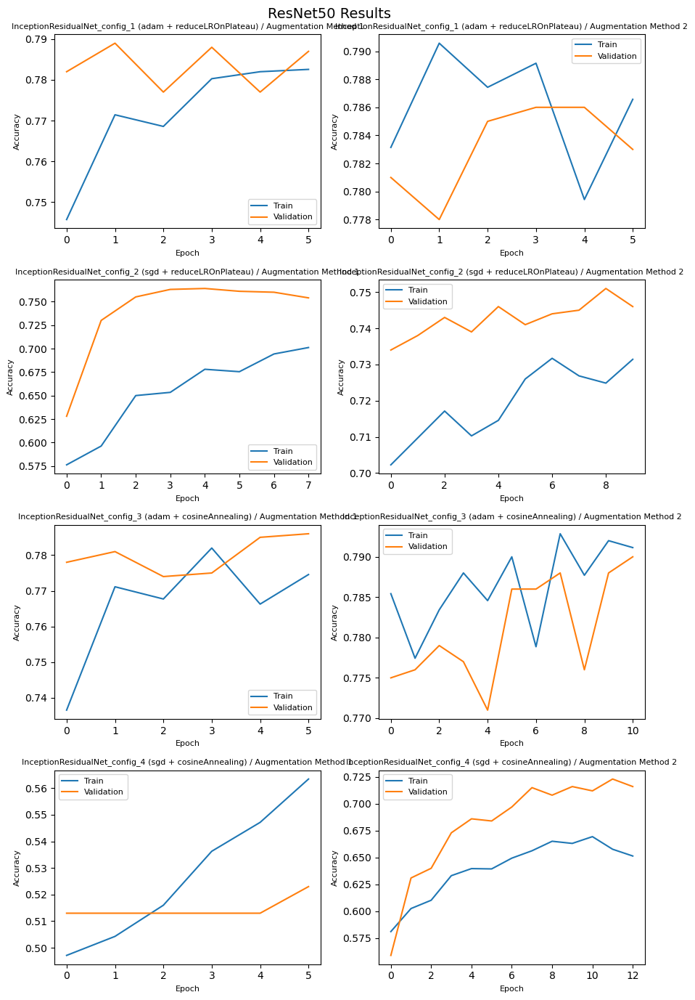

In [49]:
plot_results(results, model_configs, data_configs, title="ResNet50 Results")

In [67]:
from sklearn.metrics import accuracy_score, roc_curve, auc

def test_model(model, test_loader, loss_func, device="cpu", plot_roc=False, title="ROC Curve"):
    model.to(device)
    model.eval()

    y_true = []
    y_probs = []
    total_loss = 0.0

    with torch.no_grad():
        for i in tqdm(test_loader, desc="Testing"):
            inputs, labels = i['image'], i['label']
            #Move the batch to the device we are using.
            inputs = moveTo(inputs, device)
            labels = moveTo(labels, device)


            outputs = model(inputs)
            loss = loss_func(outputs, labels)
            total_loss += loss.item()

            probs = outputs.detach().cpu().numpy()
            y_probs.extend(probs)
            y_true.extend(labels.cpu().numpy())

    y_true = np.array(y_true)
    y_probs = np.array(y_probs)

    # Binary classification
    if y_probs.ndim == 2 and y_probs.shape[1] > 1:
        y_pred = np.argmax(y_probs, axis=1)
        y_score = y_probs[:, 1]  # Positive class probability
    else:
        y_pred = (y_probs >= 0.5).astype(int)
        y_score = y_probs

    acc = accuracy_score(y_true, y_pred)
    avg_loss = total_loss / len(test_loader)

    print(f"Test Accuracy: {acc:.4f}")
    print(f"Test Loss: {avg_loss:.4f}")

    if plot_roc:
        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(6, 4))
        plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})', lw=2)
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(title)
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return acc, avg_loss, y_true, y_pred

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7880
Test Loss: 0.5150


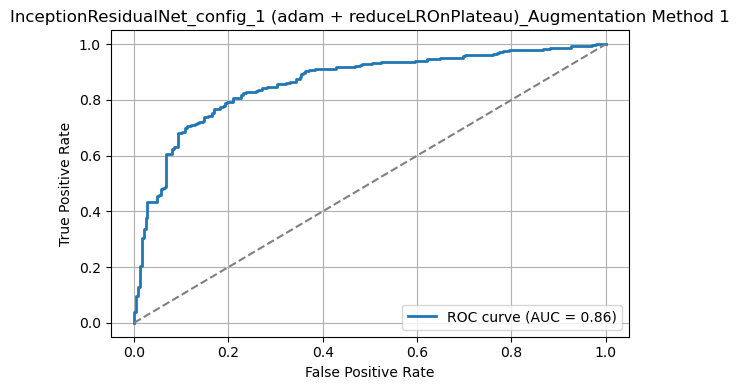

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7980
Test Loss: 0.5004


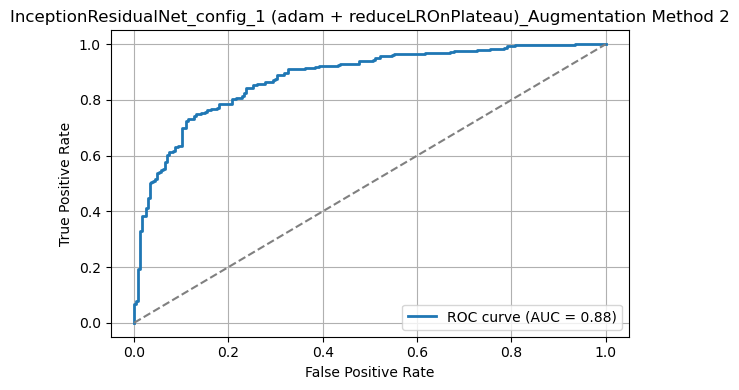

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7580
Test Loss: 0.6616


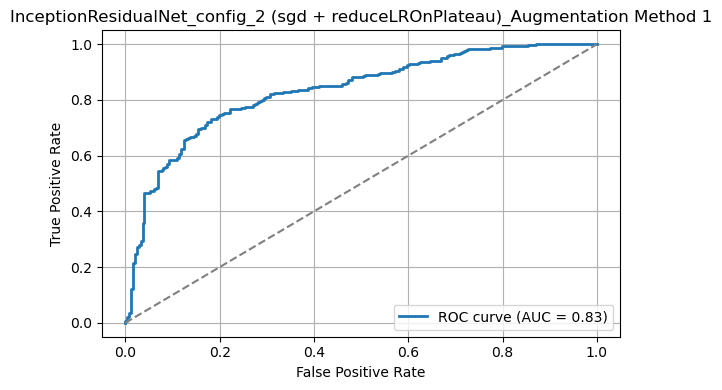

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7500
Test Loss: 0.6397


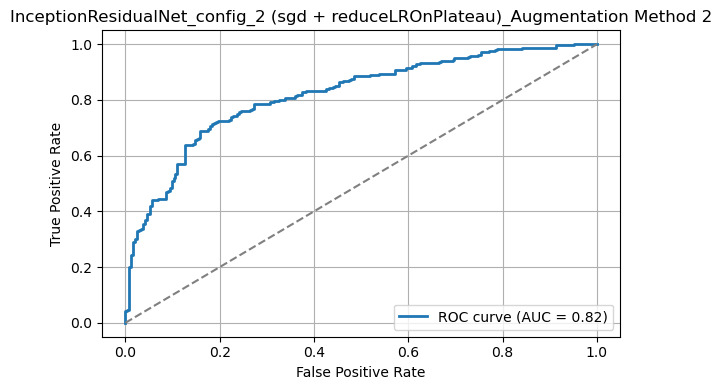

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7960
Test Loss: 0.5142


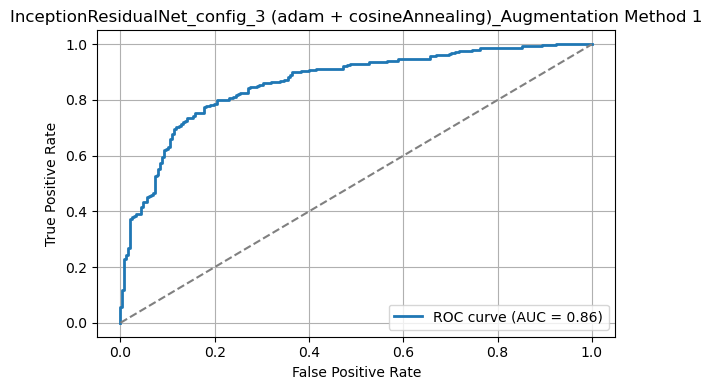

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7940
Test Loss: 0.5010


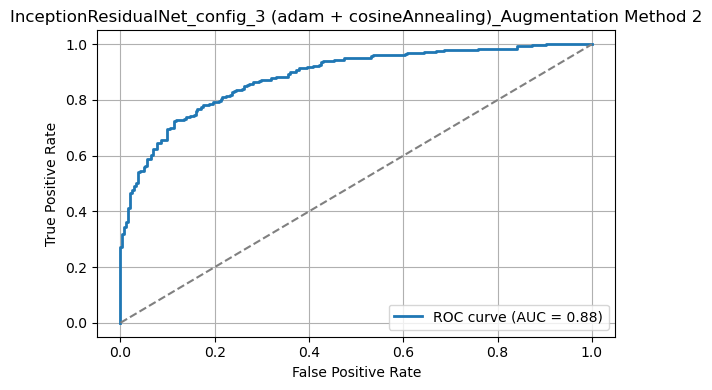

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.5180
Test Loss: 0.6740


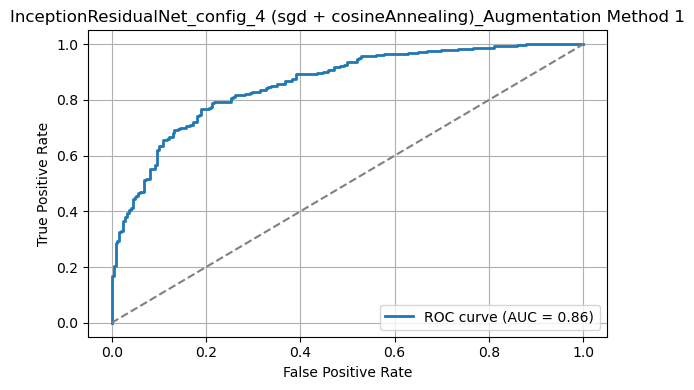

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.6920
Test Loss: 0.6619


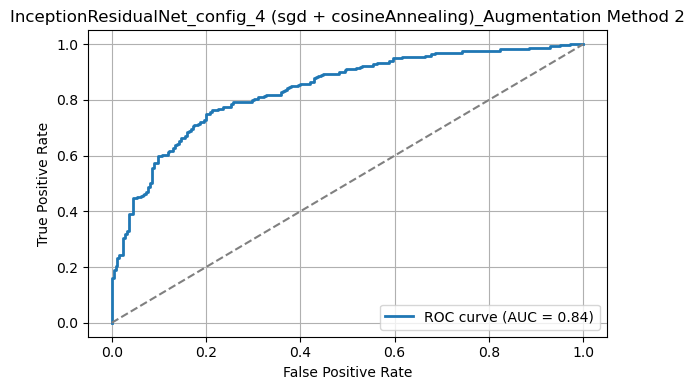

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.8680
Test Loss: 0.4471


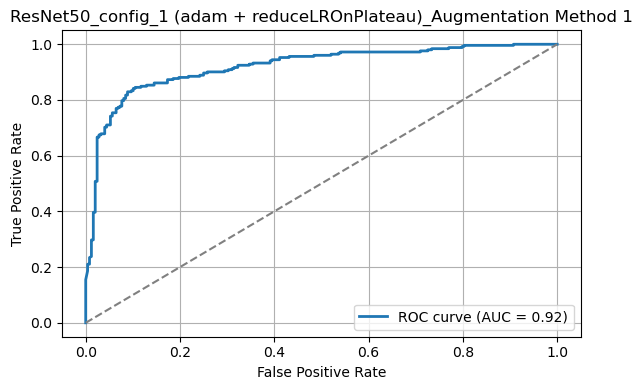

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.8700
Test Loss: 0.4363


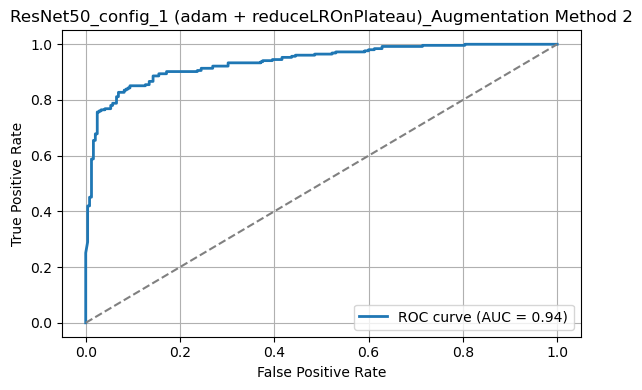

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7920
Test Loss: 0.6609


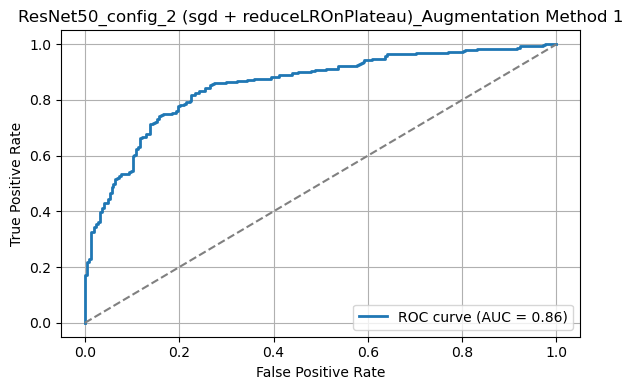

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7740
Test Loss: 0.6507


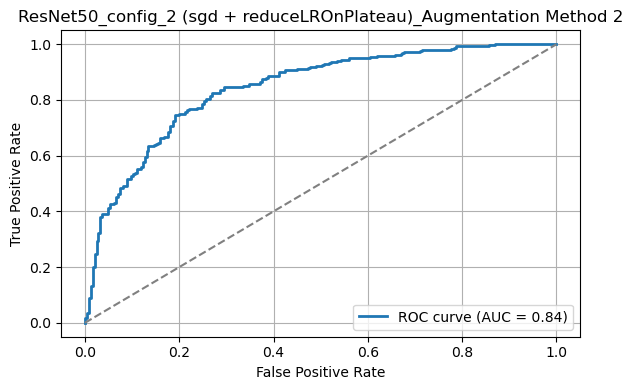

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.8500
Test Loss: 0.4674


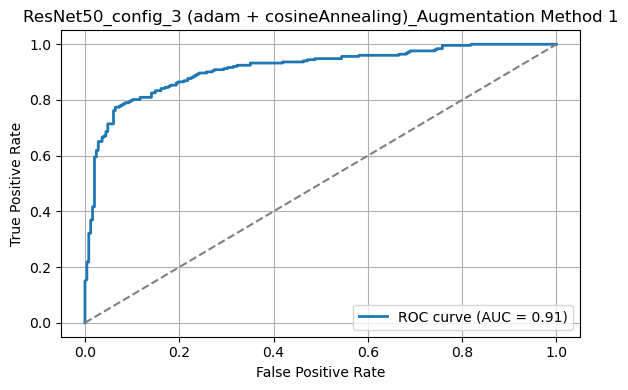

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.8900
Test Loss: 0.4168


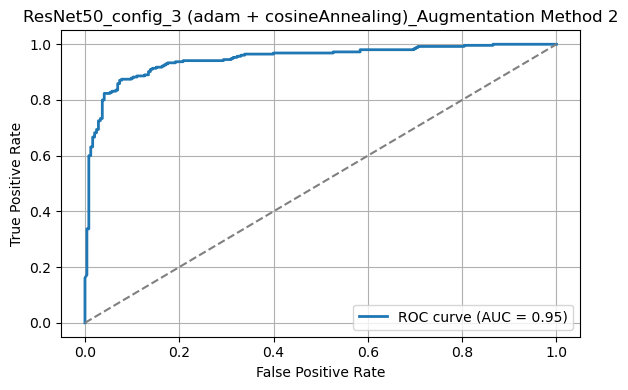

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7680
Test Loss: 0.6779


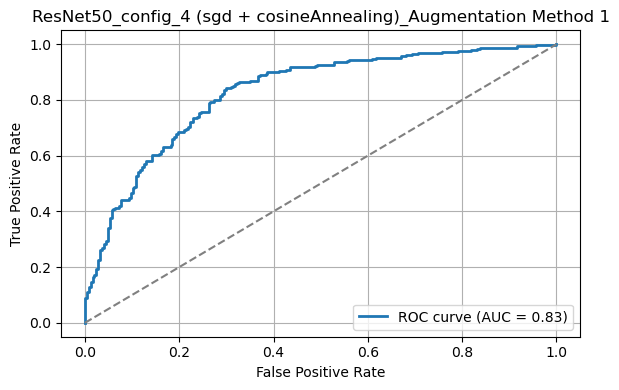

Testing:   0%|          | 0/16 [00:00<?, ?it/s]

Test Accuracy: 0.7140
Test Loss: 0.6796


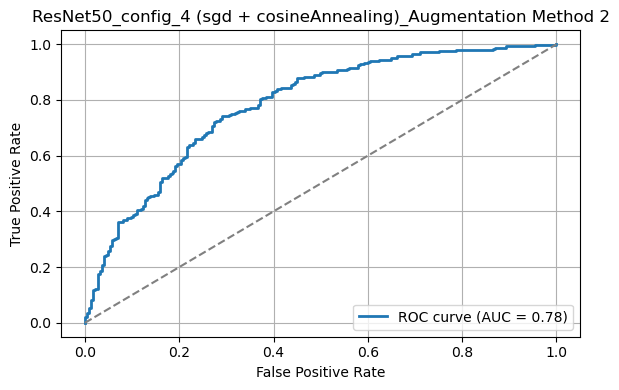

In [68]:
for m_pth in os.listdir("./saved_models/"):
    files = os.listdir(os.path.join("./saved_models/", m_pth))
    model = torch.load(os.path.join("./saved_models/", m_pth, files[0]), weights_only=False)
    model.to(device)
    model.eval()
    augmentation = 0 if "Augmentation Method 1" in m_pth else 1
    test_loader = data_configs[augmentation]['loaders']['test_loader']
    title = '_'.join(m_pth.split("_")[:-1])
    _, _, y_true, y_pred = test_model(model, test_loader, loss_func=loss_func, plot_roc=True, device=device, title=title)
    if y_true is None or y_pred is None:
        print("Warning: y_true or y_pred is empty.")